In [1]:
from mu2e import mu2e_ext_path
from mu2e.dataframeprod import g4root_to_df
from root_pandas import read_root
import pandas as pd
from mu2e.mu2eplots import mu2e_plot3d_ptrap
from mu2e.mu2eplots import mu2e_plot3d_ptrap_traj
from mu2e.mu2eplots import mu2e_plot3d_ptrap_anim
import mu2e.mu2eplots as mplt
import six.moves.cPickle as pkl
%matplotlib inline
plt.rcParams['figure.figsize'] = (12,8)
mu2e_data_path = '/Volumes/DataDump/Mu2E/'
from skhep.visual import MplPlotter as splt
from matplotlib.colors import LogNorm
pd.set_option("display.max_columns",50)

Welcome to JupyROOT 6.12/06


<IPython.core.display.Javascript object>

In [2]:
# Get pions, make a subset df of matching pions and muons

df_ntpart, df_nttvd, _ = g4root_to_df(mu2e_data_path+'pion-st-Mau13/run2/nts.bpollack.pions_Mau13_stage1_vd.v653.combined',
do_basic_modifications=True, trees=['part', 'tvd'])
df_ntpart.set_index(['run', 'subrun', 'evt'], inplace=True)

# df_mu_and_pi = df_ntpart.loc[df_ntpart.query('pdg==-211').index]
# df_mu_and_pi = df_mu_and_pi.loc[df_mu_and_pi.query('pdg==13').index]

In [64]:
df_ntpart.query('11500<z<11800 and 11500<zstop<11800')

trk  pdg        time  gtime           x           y  \
run subrun evt                                                           
1   280    260670   15   13  105.269875    0.0   20.662842 -220.344864   
    462    5754     19   13   94.478081    0.0  392.086670  421.169495   
    477    222611   15   13   92.276939    0.0  202.408936 -120.690643   
    1404   303561   40   13  133.265961    0.0  -59.729004 -132.939453   

                              z         px         py         pz           p  \
run subrun evt                                                                 
1   280    260670  11551.999023  57.019154 -53.711334 -19.169514   80.644661   
    462    5754    11706.473633 -80.644493  58.303181 -17.975864  101.123322   
    477    222611  11772.426758 -15.134595  86.993103 -15.911521   89.721970   
    1404   303561  11537.129883  57.477039 -90.652771 -17.578352  108.768257   

                   code  isstop       tstop      gtstop       xstop  \
run subrun evt                                                        
1   280    260670    14   False  410.506500  248.450500  454.805420   
    462    5754      14   False  406.898621  240.895767  238.722900   
    477    222611    14   False  425.927795  268.117004 -234.861328   
    1404   303561    14   False  487.193726  265.798035  478.340576   

                        ystop         zstop  codestop     pxstop     pystop  \
run subrun evt                                                                
1   280    260670  -75.118385  11661.334961        54  14.203272  65.235764   
    462    5754    404.933289  11507.653320        54 -67.760376  -1.598174   
    477    222611 -413.009430  11666.791016        54  51.169868 -39.808453   
    1404   303561  246.736237  11612.710938        54 -45.022205  49.127979   

                      pzstop      pstop  g4bl_evt  g4bl_trk  g4bl_weight  \
run subrun evt                                                             
1   280    260670  12.855729  67.990494         0         0          0.0   
    462    5754     5.304235  67.986450         0         0          0.0   
    477    222611  18.922712  67.536194         0         0          0.0   
    1404   303561  11.353030  67.597702         0         0          0.0   

                   g4bl_time  parent_id  parent_pdg     parent_x   parent_y  \
run subrun evt                                                                
1   280    260670        0.0          1        -211 -3837.165771 -51.493950   
    462    5754          0.0          1        -211 -3886.902832 -50.830238   
    477    222611        0.0          1        -211 -3853.090820  38.169827   
    1404   303561        0.0          1        -211 -3845.886230  15.221134   

                      parent_z   parent_px   parent_py  parent_pz    parent_p  \
run subrun evt                                                                  
1   280    260670  5742.755371  -26.120010  -86.933388 -13.526448   91.774910   
    462    5754    6037.813477   85.208870  -76.245598   1.719252  114.354271   
    477    222611  6045.299805 -114.767471   15.950026 -21.489531  117.846413   
    1404   303561  5726.971680  -13.982306 -104.110054  51.408634  116.949806   

                   parent_pxstop  parent_pystop  parent_pzstop  parent_pstop  \
run subrun evt                                                                 
1   280    260670      34.098866     -66.332680     -17.077845     76.514114   
    462    5754       -67.971764      58.035427      -3.140724     89.432297   
    477    222611     -32.989185      74.824142      -7.174310     82.087814   
    1404   303561      49.992203     -89.161316       2.390263    102.248100   

                   parent_code  parent_lastke  
run subrun evt                                 
1   280    260670           14      19.597179  
    462    5754             14      26.194639  
    477    222611           14      22.350319  
    1404   303561           14      33.445759

In [69]:
df_ntpart.describe()

,trk,pdg,time,gtime,x,y,z,px,py,pz,p,code,tstop,gtstop,xstop,ystop,zstop,codestop,pxstop,pystop,pzstop,pstop,g4bl_evt,g4bl_trk,g4bl_weight,g4bl_time,parent_id,parent_pdg,parent_x,parent_y,parent_z,parent_px,parent_py,parent_pz,parent_p,parent_pxstop,parent_pystop,parent_pzstop,parent_pstop,parent_code,parent_lastke
count,1050.000000,1050.0,1050.000000,1050.0,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.0,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.0,1050.000000,1050.000000,1050.000000,1050.000000,1050.0,1050.0,1050.0,1050.0,1050.000000,1050.0,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.000000,1050.0,1050.000000
mean,8.126667,13.0,54.300674,0.0,-6.501886,-21.245401,8450.171875,4.709631,-3.536431,13.341062,97.598526,14.0,429.124420,296.485535,-12.328197,-9.537436,11806.499023,54.0,-0.779162,-1.904336,12.414981,64.370750,0.0,0.0,0.0,0.0,1.020000,-211.0,-3904.207031,1.129486,5905.632812,-3.380294,-3.481088,2.501574,103.196564,4.456216,-3.899835,23.075956,96.920753,14.0,30.662666
std,9.341225,0.0,45.525402,0.0,242.946350,243.558823,2242.815186,65.662460,66.551193,27.060106,12.295934,0.0,30.070793,42.958637,283.128448,285.687836,801.402100,0.0,44.478268,43.722149,10.359601,2.870025,0.0,0.0,0.0,0.0,0.403252,0.0,48.039459,46.063324,354.490692,72.336678,70.713379,22.500092,10.458385,63.766003,63.976833,28.805758,12.426987,0.0,6.970491
min,3.000000,13.0,0.013213,0.0,-586.184570,-683.957092,5062.910156,-119.175110,-124.875587,-62.846546,70.028664,14.0,400.011139,130.325562,-587.847168,-548.491882,7185.634766,54.0,-67.760376,-67.953903,-36.742981,58.256199,0.0,0.0,0.0,0.0,1.000000,-211.0,-4392.702148,-315.882904,5470.023438,-118.725830,-119.049049,-34.802780,80.240013,-113.880638,-115.224693,-49.361649,54.687668,14.0,10.331715
25%,3.000000,13.0,17.941624,0.0,-184.103516,-203.137711,6244.748901,-58.927476,-67.722836,-11.368973,89.320494,14.0,408.546593,272.966034,-278.385986,-279.538460,11849.344482,54.0,-44.789353,-43.458361,7.368888,61.844374,0.0,0.0,0.0,0.0,1.000000,-211.0,-3942.049927,-39.086003,5700.781128,-73.418732,-71.432228,-16.555582,95.159922,-55.629223,-64.516327,-2.726460,88.207645,14.0,25.537145
50%,3.000000,13.0,42.521549,0.0,-2.919922,-24.298779,8134.089844,7.984866,-6.850369,12.257533,97.466824,14.0,420.255997,300.947968,-36.250610,-9.919006,11868.924805,54.0,-1.182995,-3.204562,11.183363,64.304104,0.0,0.0,0.0,0.0,1.000000,-211.0,-3903.408569,1.810674,5904.197754,-6.876143,-4.457725,-0.072139,104.266685,6.296910,-7.340524,24.251326,97.244736,14.0,30.536782
75%,10.000000,13.0,81.239967,0.0,166.465881,155.653305,10802.947266,66.736628,59.812549,35.206652,106.135588,14.0,440.359146,323.355949,257.033691,270.127563,11947.668213,54.0,43.654938,39.617251,14.936027,67.494665,0.0,0.0,0.0,0.0,1.000000,-211.0,-3866.503113,40.420313,6100.017334,66.747398,64.412882,18.793193,112.093880,63.671984,59.681269,49.835299,107.129166,14.0,36.374410
max,68.000000,13.0,258.373016,0.0,634.640869,573.356445,12749.777344,119.601852,117.701134,84.166771,129.940323,14.0,657.466797,479.155151,569.010498,622.127258,15196.825195,54.0,67.709366,67.667351,58.062801,68.017143,0.0,0.0,0.0,0.0,10.000000,-211.0,-3637.194580,321.262543,11641.032227,117.974121,117.855103,57.683155,119.976936,116.715103,113.895920,80.382133,119.888466,14.0,44.421902


In [5]:
store_xray = pd.HDFStore(mu2e_data_path+'G4ParticleSim/low_e_ele_0T_v580.h5')
df_xray = store_xray.df_ntpart
store_xray.close()

In [43]:
mu2e_plot3d_ptrap(df_ntpart,
                  'zstop','xstop','ystop', x_range=[3700,17500], y_range = [-1000,1000], z_range=[-1000,1000], save_name=None,
                   df_xray=df_xray, color='pstop', title='Muon position at event termination')

binning...
binned


In [65]:
df_mu_single = df_nttvd.query('subrun==1404 and evt==303561 and pdg==13').sort_values('time')
df_mu_single.name = 'Muon'
df_pi_single = df_nttvd.query('subrun==1404 and evt==303561 and pdg<0').sort_values('time')
df_pi_single.name = 'Pion'

In [70]:
df_mu_single

,evt,trk,sid,pdg,time,x,y,z,px,py,pz,gtime,code,g4bl_weight,g4bl_time,run,ke,subrun,p
312766,303561.0,40.0,135.0,13.0,134.010025,50.945557,-243.791000,11511.340820,90.574013,-57.629665,-17.484396,0.518451,48.0,0.0,0.0,1.0,45.980099,1404.0,108.768257
312767,303561.0,40.0,136.0,13.0,135.017715,254.104248,-299.819153,11476.647461,107.334747,3.013921,-17.340761,1.220589,49.0,0.0,0.0,1.0,45.980099,1404.0,108.768257
312768,303561.0,40.0,137.0,13.0,136.023407,453.388916,-232.440689,11442.313477,87.311714,62.357224,-17.447588,1.921339,49.0,0.0,0.0,1.0,45.932755,1404.0,108.702240
312769,303561.0,40.0,138.0,13.0,137.071625,584.691162,-57.426060,11406.425781,35.287697,101.132240,-17.133213,2.652656,48.0,0.0,0.0,1.0,45.768810,1404.0,108.473495
312770,303561.0,40.0,139.0,13.0,138.002960,596.462646,137.256348,11375.053711,-22.853939,104.684113,-16.894745,3.302492,48.0,0.0,0.0,1.0,45.768810,1404.0,108.473495
312771,303561.0,40.0,140.0,13.0,139.014694,492.384766,321.315948,11341.477539,-77.876709,73.661186,-16.516212,4.008430,49.0,0.0,0.0,1.0,45.759029,1404.0,108.459839
312772,303561.0,40.0,141.0,13.0,140.217651,262.569824,419.360352,11302.647461,-106.923721,5.116602,-16.169140,4.848572,49.0,0.0,0.0,1.0,45.616196,1404.0,108.260353
312773,303561.0,40.0,142.0,13.0,141.045319,92.175537,384.881622,11276.653320,-96.677406,-45.932819,-15.411918,5.426809,49.0,0.0,0.0,1.0,45.528809,1404.0,108.138206
312774,303561.0,40.0,143.0,13.0,142.024185,-59.881104,247.592010,11246.879883,-55.590240,-91.490471,-15.267313,6.110898,48.0,0.0,0.0,1.0,45.528809,1404.0,108.138206
312775,303561.0,40.0,144.0,13.0,143.050217,-111.112305,39.339916,11215.971680,6.805808,-106.859612,-15.118726,6.827942,48.0,0.0,0.0,1.0,45.528809,1404.0,108.138206


In [67]:
mu2e_plot3d_ptrap_traj([df_pi_single, df_mu_single],'z','x','y',df_xray=df_xray,
                        title='Bad Pion Adventure', aspect='default')

binning...
binned


Text(0.5,0,'time (ns)')

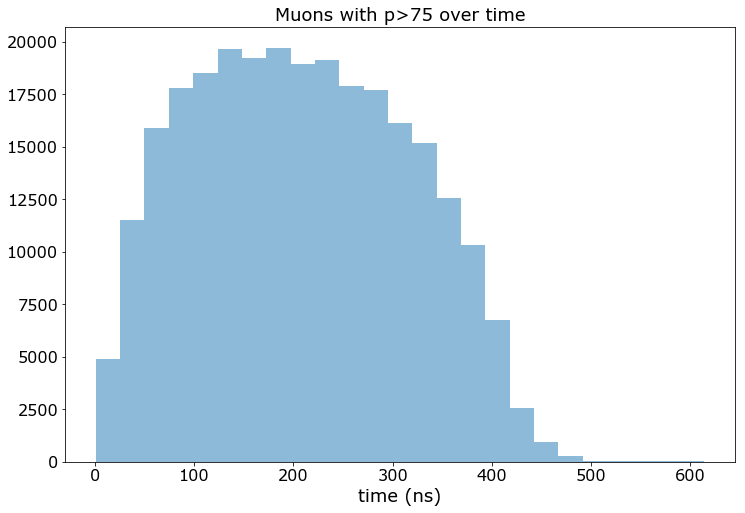

In [63]:
_ = splt.hist(df_nttvd.query('pdg==13 and p>75').time, bins='doane')
plt.title('Muons with p>75 over time')
plt.xlabel('time (ns)')

(array([ 41.,  42.,  60.,  78.,  91.,  87., 108.,  84., 134., 108., 114.,
        103.]), array([ 80.24001312,  83.55142339,  86.86283366,  90.17424393,
         93.4856542 ,  96.79706446, 100.10847473, 103.419885  ,
        106.73129527, 110.04270554, 113.3541158 , 116.66552607,
        119.97693634]), <a list of 1 Patch objects>)

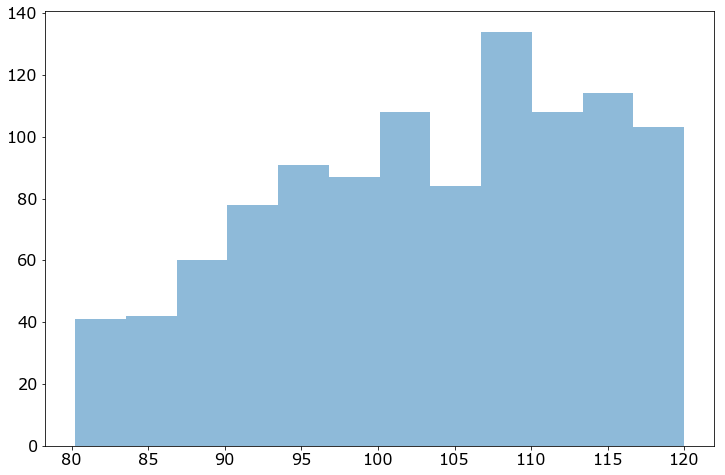

In [71]:
splt.hist(df_ntpart.parent_p)

(array([ 24.,  31.,  28.,  41.,  61.,  71.,  91.,  98., 112.,  92., 104.,
         84.,  62.,  51.,  39.,  26.,  16.,  17.,   2.]),
 array([ 70.02866364,  73.18190886,  76.33515408,  79.4883993 ,
         82.64164453,  85.79488975,  88.94813497,  92.1013802 ,
         95.25462542,  98.40787064, 101.56111587, 104.71436109,
        107.86760631, 111.02085154, 114.17409676, 117.32734198,
        120.48058721, 123.63383243, 126.78707765, 129.94032288]),
 <a list of 1 Patch objects>)

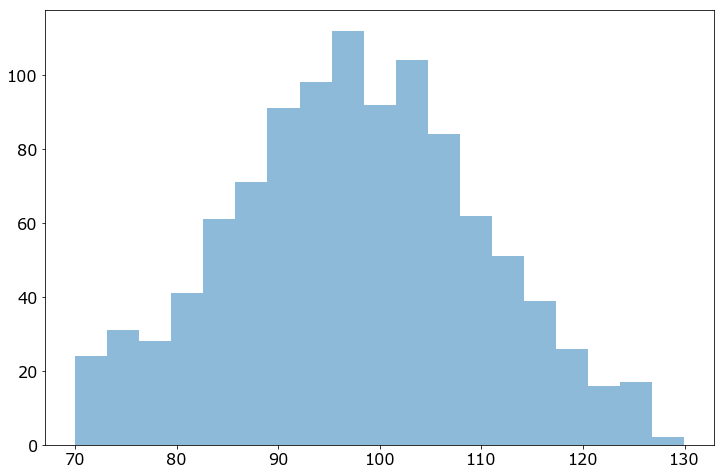

In [72]:
splt.hist(df_ntpart.p)

# Observations

40m Pions Generated, 52-80 MeV mom

    1) Low Z region: Around the OPA.
        a) Primary Ring at Z=~5000
        b) Secondary Ring at Z=~5660
        c) Tertiary Ring? at Z=~6300
    2) Tracker section:
        a) Primary Group at 9200<Z<11000
        b) Secondary Group at Z=~11700
    3) Calo section:
        a) Single group at Z=~13000

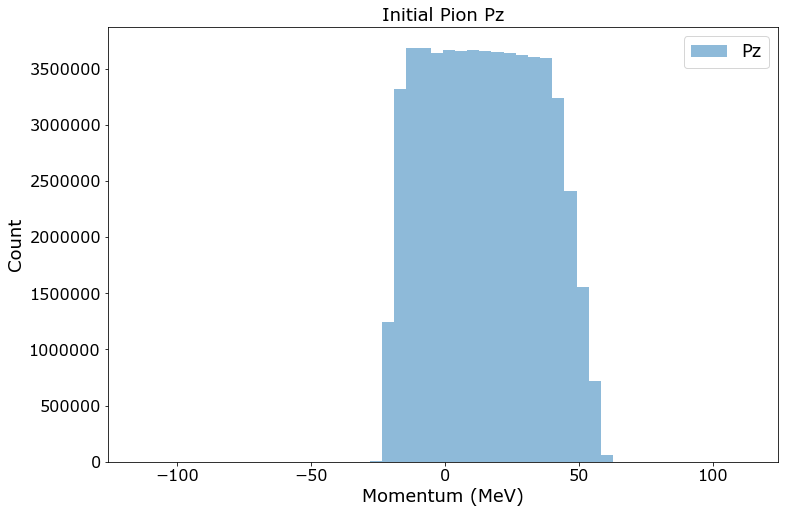

In [7]:
_ = splt.hist(df_ntpart.parent_pz.values, bins=50, label='Pz')
plt.legend()
plt.title('Initial Pion Pz')
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')


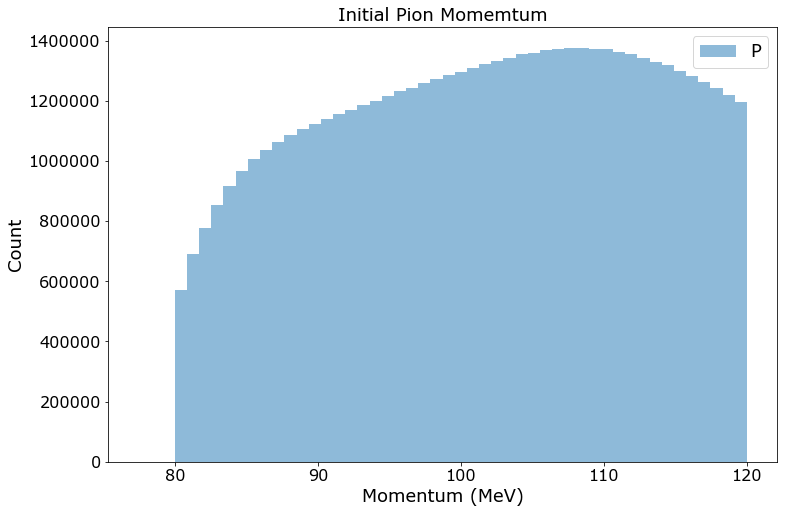

In [6]:
_ = splt.hist(df_ntpart.parent_p.values, bins=50, label='P')
plt.legend()
plt.title('Initial Pion Momemtum')
plt.xlabel('Momentum (MeV)')
plt.ylabel('Count')

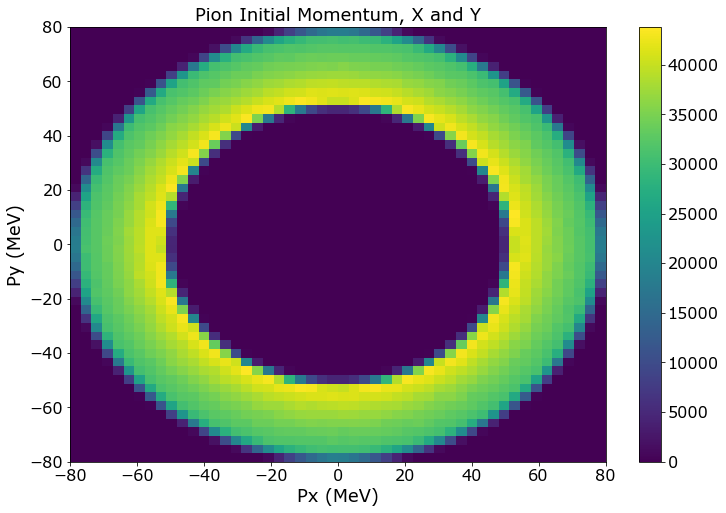

In [16]:
plt.hist2d(df_pions.px.values, df_pions.py.values, bins=50)
plt.xlabel('Px (MeV)')
plt.ylabel('Py (MeV)')
plt.title('Pion Initial Momentum, X and Y')
plt.colorbar()

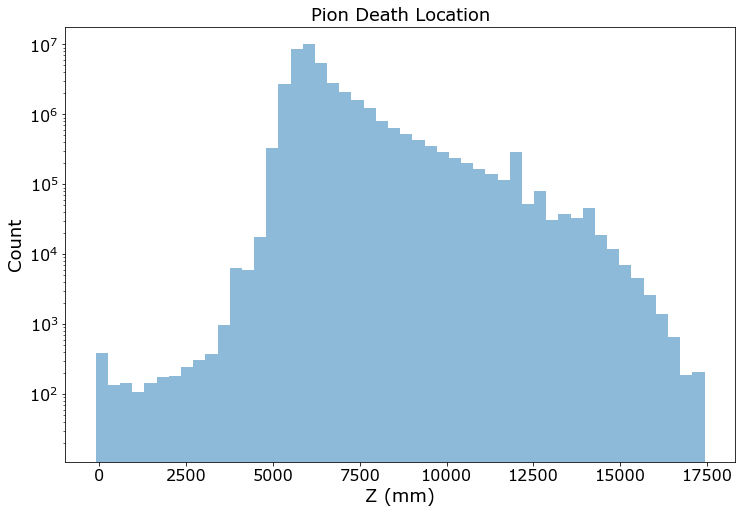

In [23]:
_ = splt.hist(df_pions.zstop.values, bins=50, log=True)
plt.title('Pion Death Location')
plt.xlabel('Z (mm)')
plt.ylabel('Count')

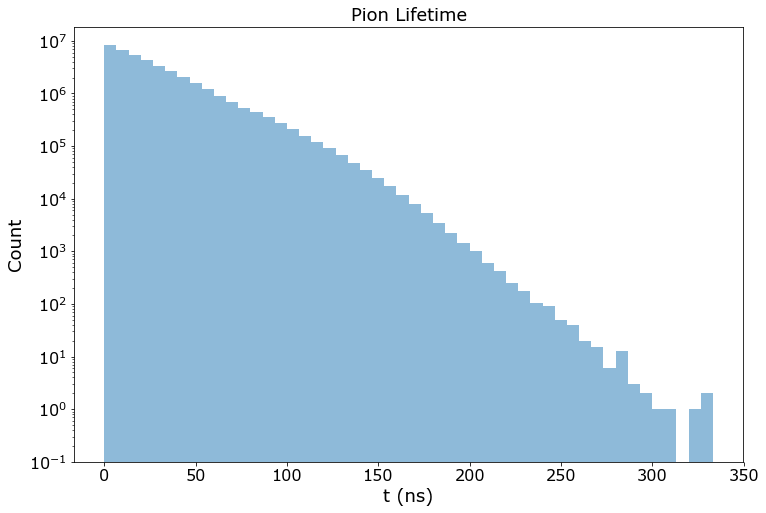

In [14]:
_ = splt.hist(df_pions.tstop.values, bins=50, log=True)
plt.title('Pion Lifetime')
plt.xlabel('t (ns)')
plt.ylabel('Count')

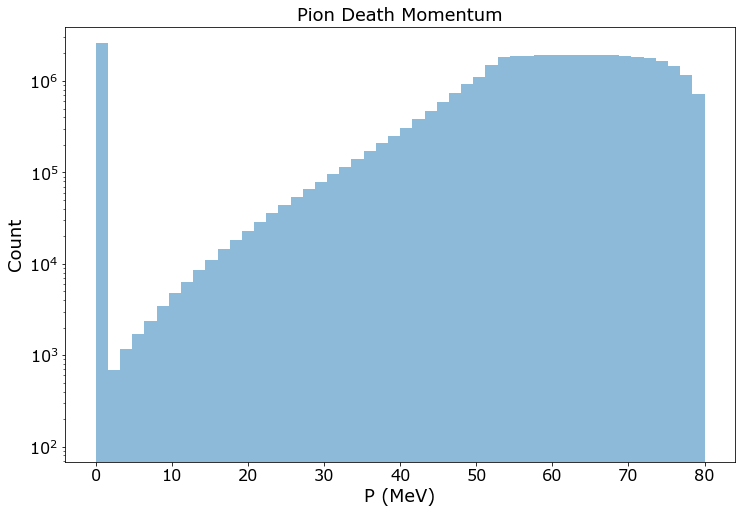

In [25]:
_ = splt.hist(df_pions.pstop.values, bins=50, log=True)
plt.title('Pion Death Momentum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')

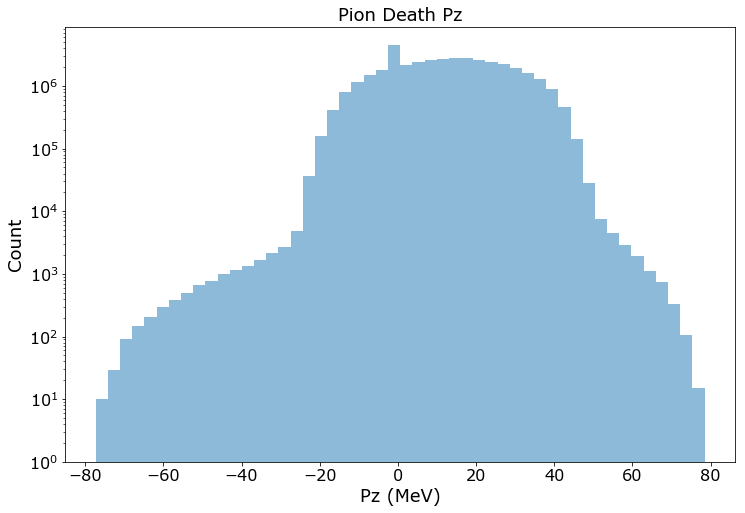

In [13]:
_ = splt.hist(df_pions.pzstop.values, bins=50, log=True)
plt.title('Pion Death Pz')
plt.xlabel('Pz (MeV)')
plt.ylabel('Count')

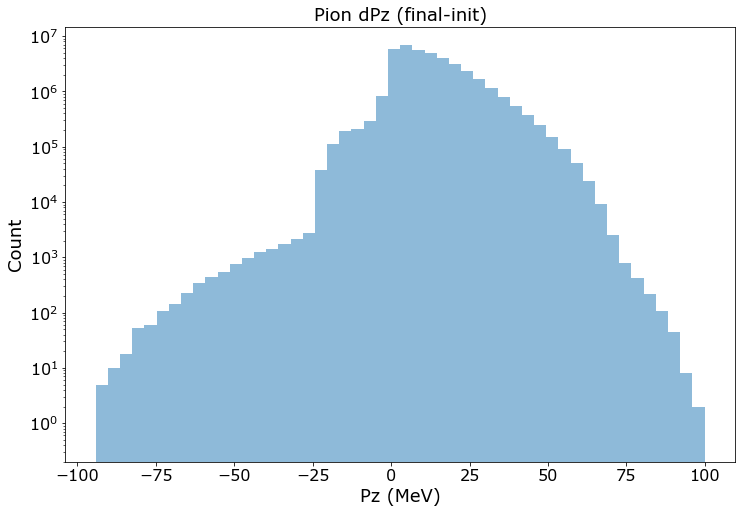

In [11]:
_ = splt.hist(df_pions.pzstop.values-df_pions.pz.values, bins=50, log=True)
plt.title('Pion dPz (final-init)')
plt.xlabel('Pz (MeV)')
plt.ylabel('Count')

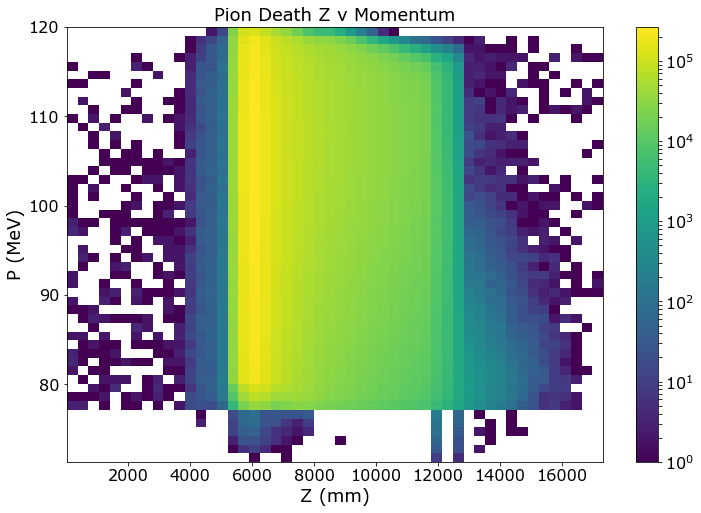

In [9]:
_ = plt.hist2d(df_ntpart.z.values,df_ntpart.parent_pstop.values, bins=50, norm=LogNorm())
plt.title('Pion Death Z v Momentum')
plt.xlabel('Z (mm)')
plt.ylabel('P (MeV)')
plt.colorbar()

In [4]:
df_mu = df_ntpart.query('pdg==13')

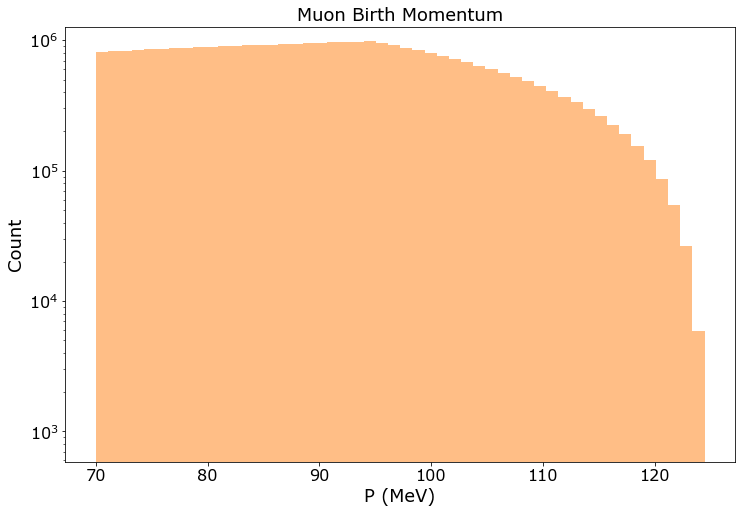

In [15]:
_ = splt.hist(df_ntpart.p.values, bins=50, log=True, color='C1')
plt.title('Muon Birth Momentum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')

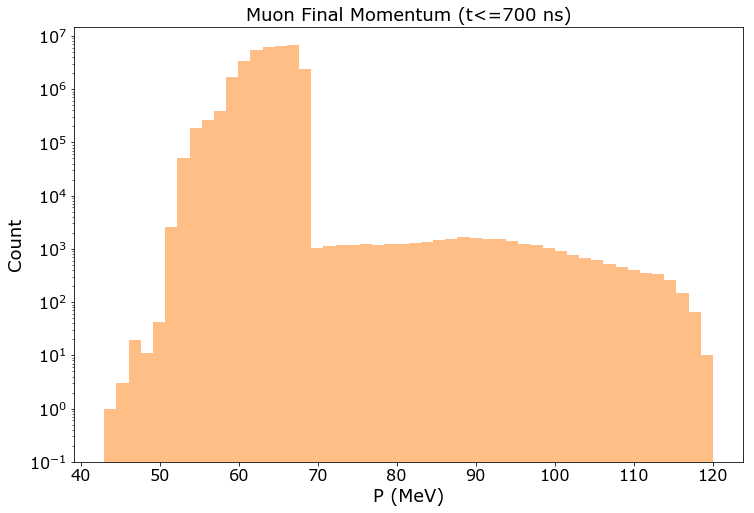

In [16]:
_ = splt.hist(df_ntpart.pstop.values, bins=50, log=True, color='C1')
plt.title('Muon Final Momentum (t<=700 ns)')
plt.xlabel('P (MeV)')
plt.ylabel('Count')

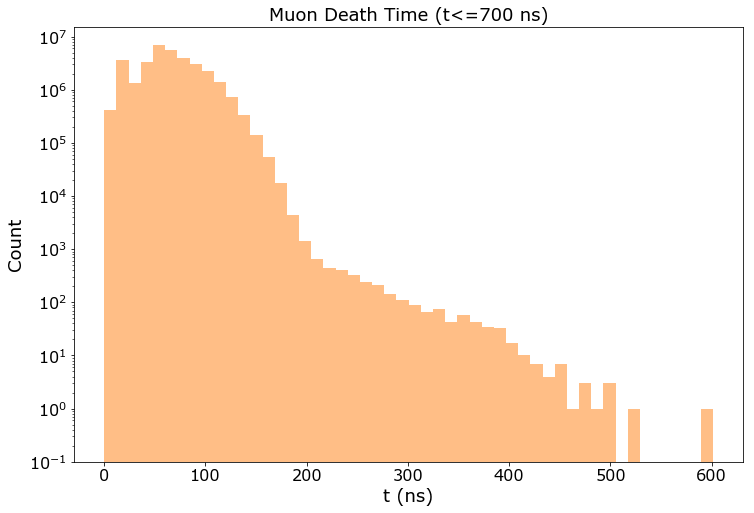

In [18]:
_ = splt.hist(df_ntpart.tstop.values, bins=50, log=True, color='C1')
plt.title('Muon Death Time (t<=700 ns)')
plt.xlabel('t (ns)')
plt.ylabel('Count')

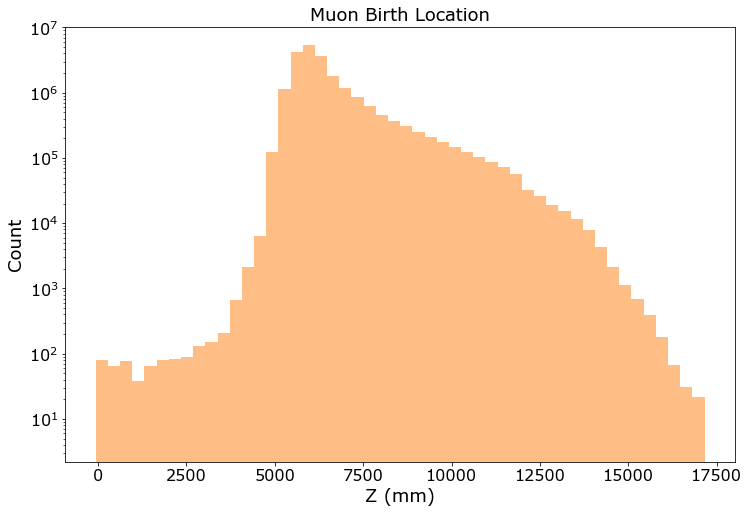

In [43]:
_ = splt.hist(df_mu.z.values, bins=50, log=True, color='C1')
plt.title('Muon Birth Location')
plt.xlabel('Z (mm)')
plt.ylabel('Count')

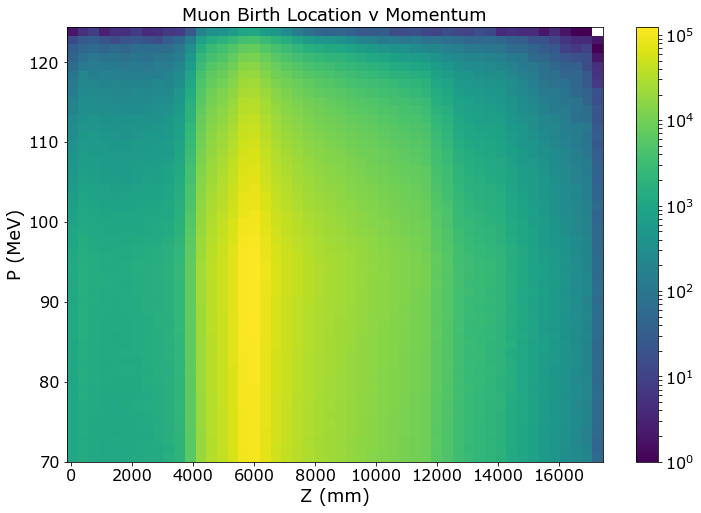

In [19]:
plt.hist2d(df_ntpart.z.values, df_ntpart.p.values, bins=50, norm=LogNorm())
plt.title('Muon Birth Location v Momentum')
plt.xlabel('Z (mm)')
plt.ylabel('P (MeV)')
plt.colorbar()

In [20]:
df_mu_bad = df_ntpart.query('9600<z<13300 and p>75')

In [22]:
df_mu_bad

trk  pdg       time  gtime           x           y  \
run subrun evt                                                         
1   0      68       5   13  62.694576    0.0   83.155518  -32.501244   
           91       7   13  48.783039    0.0  187.958008 -336.332489   
           95       3   13  48.889275    0.0   64.428955  181.851074   
           97       3   13  30.589823    0.0  -72.163330  -45.165436   
           101     10   13  43.883514    0.0 -217.602051   36.098019   
           180      7   13  66.922394    0.0  355.665283  452.708374   
           196     15   13  64.002609    0.0   36.623047 -240.688889   
           320      8   13  49.666878    0.0  118.687744  127.753212   
           366      3   13  46.454487    0.0   77.300781  183.148148   
           383     10   13  64.277359    0.0 -150.009766  132.229614   
           448      3   13  59.561028    0.0 -218.256836 -109.739517   
           473      6   13  78.715286    0.0 -311.617676  223.414612   
           548      3   13  49.269215    0.0   54.896973   99.957481   
           570      3   13  52.186985    0.0  -22.303467   43.657093   
           573      3   13  34.624546    0.0   77.977051  190.863464   
           577      6   13  36.438808    0.0 -225.312500 -527.569946   
           637      6   13  39.697186    0.0   20.976074   33.592834   
           641      3   13  53.695950    0.0   37.261719 -153.661819   
           649      3   13  36.557327    0.0  -73.759277 -332.026154   
           667      3   13  25.332848    0.0  131.459229  238.459412   
           719      5   13  74.982170    0.0    8.612549   87.087448   
           736      3   13  24.098511    0.0  117.955811   93.071388   
           744      3   13  38.286945    0.0  -62.862549    4.263286   
           768      3   13  69.989342    0.0  265.616211 -386.138916   
           781      4   13  38.541008    0.0   23.301758 -376.215759   
           859      9   13  38.734562    0.0 -127.405273 -455.654938   
           867      3   13  38.660374    0.0   98.163818 -158.931473   
           890      3   13  43.067062    0.0  -90.243652  226.921585   
           895      3   13  26.770670    0.0  127.433105  211.388062   
           910      4   13  32.391472    0.0 -185.295654  -44.708599   
...               ...  ...        ...    ...         ...         ...   
    999    99120    9   13  46.721855    0.0 -263.341309 -407.095184   
           99132    3   13  44.912598    0.0 -109.549316 -137.129364   
           99155    3   13  41.120407    0.0  -28.489990 -255.323990   
           99175    5   13  66.085968    0.0 -198.304199 -167.172287   
           99207    3   13  34.919926    0.0  139.284668 -286.668457   
           99228   10   13  55.116158    0.0 -334.827148   66.429192   
           99231    3   13  27.395313    0.0  334.549316  -22.651814   
           99265   12   13  54.476048    0.0  -50.755859 -207.409195   
           99269    3   13  25.187052    0.0  239.002930  351.391266   
           99274    8   13  42.699902    0.0  -30.049072    7.136942   
           99350    5   13  71.140335    0.0  -82.902588 -105.838326   
           99385    7   13  72.812553    0.0   91.297852 -247.068268   
           99401    7   13  68.766083    0.0 -102.014893 -477.371857   
           99443    3   13  42.462929    0.0 -298.883301  -33.165943   
           99464    9   13  70.005569    0.0   81.196289   45.581551   
           99480    3   13  43.300987    0.0  -74.095703  -14.347290   
           99482    3   13  49.122932    0.0  -70.402100 -152.211502   
           99504    8   13  69.366753    0.0 -333.085938   96.995140   
           99510    3   13  44.619915    0.0   54.732910  -49.246384   
           99595    5   13  80.480492    0.0 -320.012695   24.098227   
           99603    3   13  29.881069    0.0  -62.834229  -21.276020   
           99624    4   13  35.142403    0.0 -306.181152   98.967636   
           99761    3   13  42.636219    0.0   75.758057 -

In [29]:
df_mu_bad_narrow = df_mu_bad[(df_mu_bad.pz<10)&(df_mu_bad.pz>-10)]

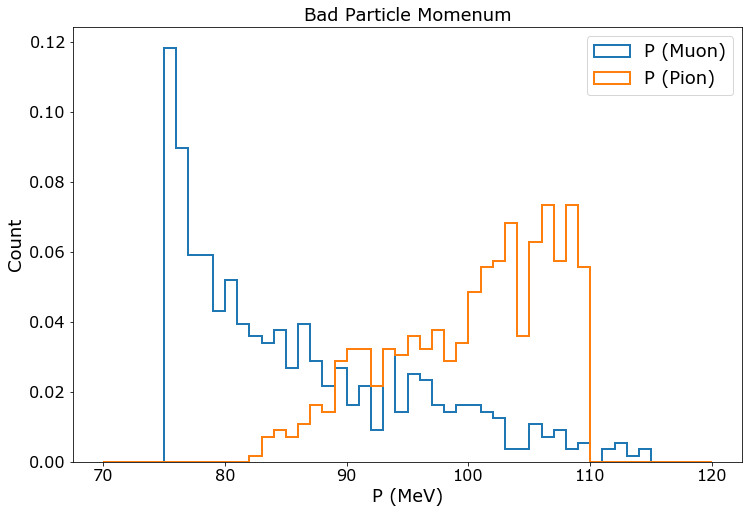

In [38]:
_ = splt.hist(df_mu_bad_narrow.p.values, bins=50, histtype='step', label='P (Muon)', range=(70,120), normed=True)
_ = splt.hist(df_mu_bad_narrow.parent_p.values, bins=50, histtype='step', label='P (Pion)', range=(70,120), normed=True)
plt.title('Bad Particle Momenum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()

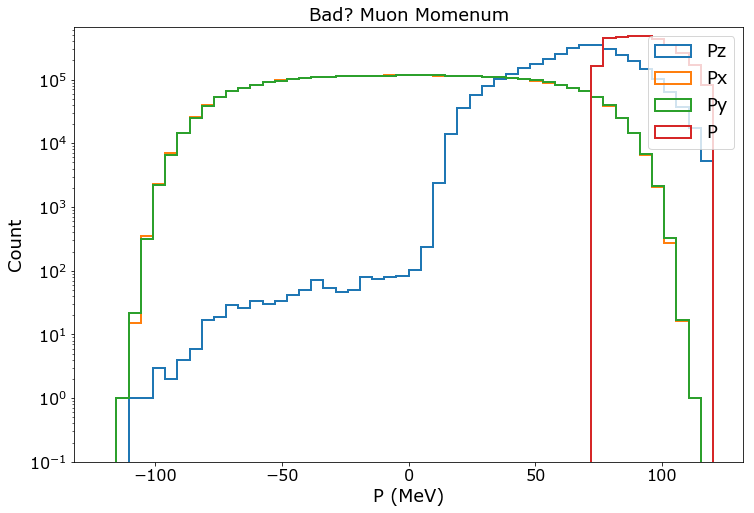

In [28]:
_ = splt.hist(df_mu_bad.pz.values, bins=50, log=True, histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad.px.values, bins=50, log=True, histtype='step', label='Px', range=(-120,120))
_ = splt.hist(df_mu_bad.py.values, bins=50, log=True, histtype='step', label='Py', range=(-120,120))
_ = splt.hist(df_mu_bad.p.values, bins=50, log=True, histtype='step', label='P', range=(-120,120))
plt.title('Bad? Muon Momenum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()

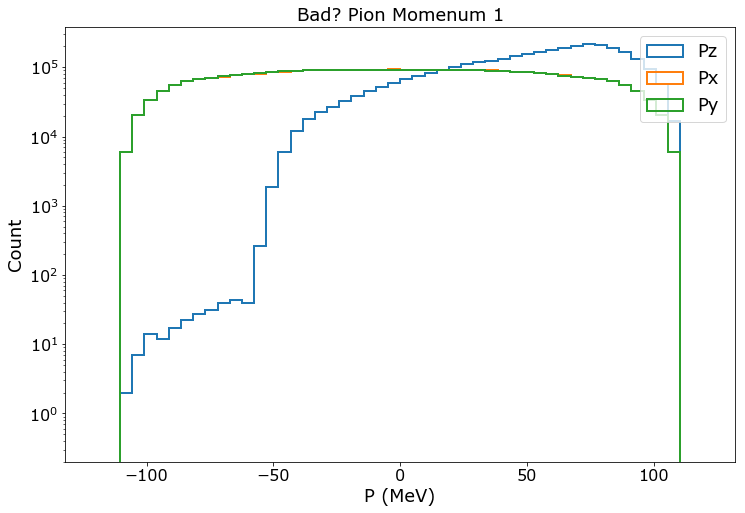

In [24]:
_ = splt.hist(df_mu_bad.parent_pz.values, bins=50, log=True, histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad.parent_px.values, bins=50, log=True, histtype='step', label='Px', range=(-120,120))
_ = splt.hist(df_mu_bad.parent_py.values, bins=50, log=True, histtype='step', label='Py', range=(-120,120))
plt.title('Bad? Pion Momenum 1')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()

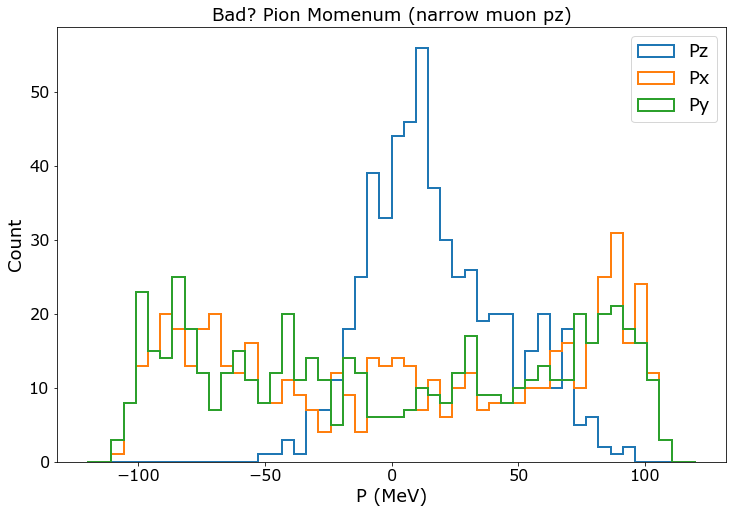

In [40]:
_ = splt.hist(df_mu_bad[(df_mu_bad.pz<10)&(df_mu_bad.pz>-10)].parent_pz.values, bins=50,  histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad[(df_mu_bad.pz<10)&(df_mu_bad.pz>-10)].parent_px.values, bins=50,  histtype='step', label='Px', range=(-120,120))
_ = splt.hist(df_mu_bad[(df_mu_bad.pz<10)&(df_mu_bad.pz>-10)].parent_py.values, bins=50,  histtype='step', label='Py', range=(-120,120))
#_ = splt.hist(df_mu_bad[(df_mu_bad.pz<10)&(df_mu_bad.pz>-10)].parent_p.values, bins=50, histtype='step', label='P', range=(-120,120))
plt.title('Bad? Pion Momenum (narrow muon pz)')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()

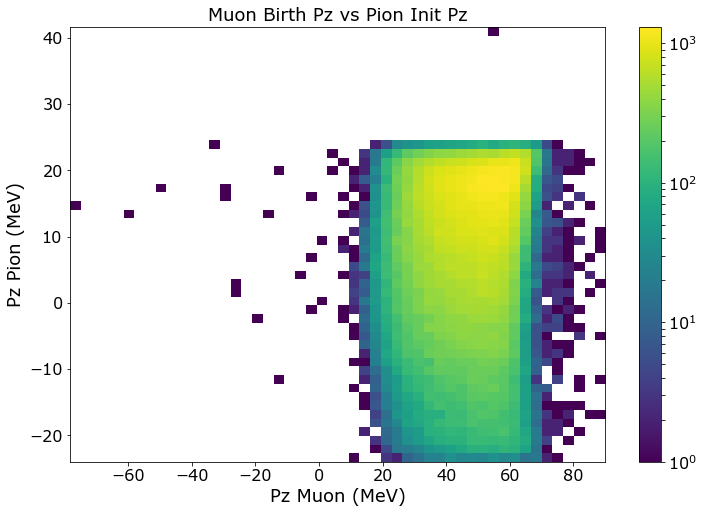

In [51]:
plt.hist2d(df_mu_bad.pz.values, df_mu_bad.parent_pz.values, bins=50, norm=LogNorm())
plt.title('Muon Birth Pz vs Pion Init Pz')
plt.xlabel('Pz Muon (MeV)')
plt.ylabel('Pz Pion (MeV)')
plt.colorbar()

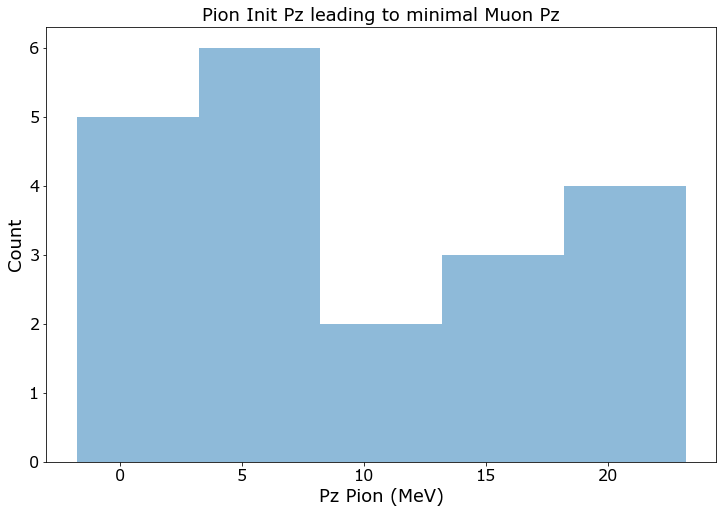

In [18]:
_ = splt.hist(df_mu_bad[(df_mu_bad.pz<10)&(df_mu_bad.pz>-10)].parent_pz.values, bins=5)
plt.title('Pion Init Pz leading to minimal Muon Pz')
plt.xlabel('Pz Pion (MeV)')
plt.ylabel('Count')

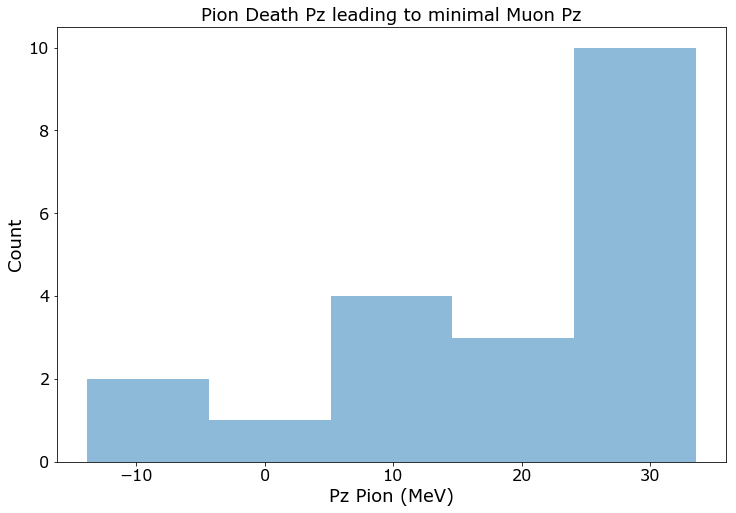

In [17]:
_ = splt.hist(df_mu_bad[(df_mu_bad.pz<10)&(df_mu_bad.pz>-10)].parent_pzstop.values, bins=5)
plt.title('Pion Death Pz leading to minimal Muon Pz')
plt.xlabel('Pz Pion (MeV)')
plt.ylabel('Count')

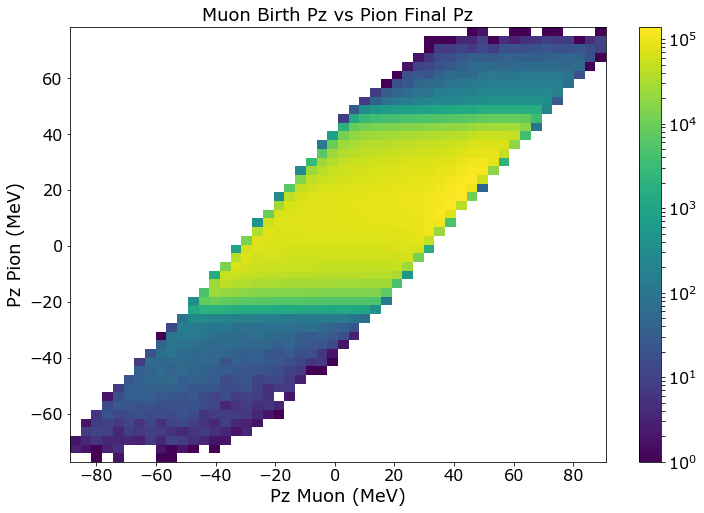

In [21]:
plt.hist2d(df_mu.pz.values, df_mu.parent_pzstop.values, bins=50, norm=LogNorm())
plt.title('Muon Birth Pz vs Pion Final Pz')
plt.xlabel('Pz Muon (MeV)')
plt.ylabel('Pz Pion (MeV)')
plt.colorbar()

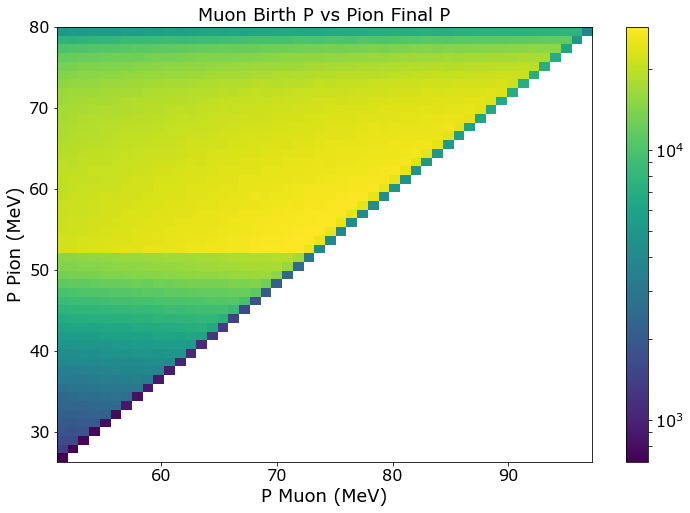

In [22]:
plt.hist2d(df_mu.p.values, df_mu.parent_pstop.values, bins=50, norm=LogNorm())
plt.title('Muon Birth P vs Pion Final P')
plt.xlabel('P Muon (MeV)')
plt.ylabel('P Pion (MeV)')
plt.colorbar()

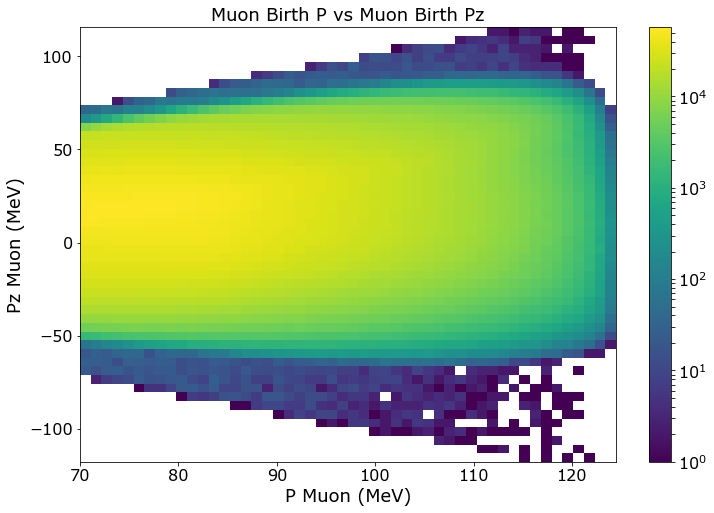

In [21]:
plt.hist2d(df_ntpart.p.values, df_ntpart.pz.values, bins=50, norm=LogNorm())
plt.title('Muon Birth P vs Muon Birth Pz')
plt.xlabel('P Muon (MeV)')
plt.ylabel('Pz Muon (MeV)')
plt.colorbar()

In [6]:
df_mu_bad = df_ntpart.query('tstop>600')

In [17]:
df_mu_bad['pr'] = df_mu_bad['px']*np.cos(np.arctan2(df_mu_bad['y'], df_mu_bad['x']))+df_mu_bad['py']*np.sin(np.arctan2(df_mu_bad['y'], df_mu_bad['x']))
df_mu_bad['prstop'] = df_mu_bad['pxstop']*np.cos(np.arctan2(df_mu_bad['ystop'], df_mu_bad['xstop']))+df_mu_bad['pystop']*np.sin(np.arctan2(df_mu_bad['ystop'], df_mu_bad['xstop']))
df_mu_bad['parent_pr'] = df_mu_bad['parent_px']*np.cos(np.arctan2(df_mu_bad['parent_y'], df_mu_bad['parent_x']))+df_mu_bad['parent_py']*np.sin(np.arctan2(df_mu_bad['parent_y'], df_mu_bad['parent_x']))
df_mu_bad['parent_prstop'] = df_mu_bad['parent_pxstop']*np.cos(np.arctan2(df_mu_bad['y'], df_mu_bad['x']))+df_mu_bad['parent_pystop']*np.sin(np.arctan2(df_mu_bad['y'], df_mu_bad['x']))


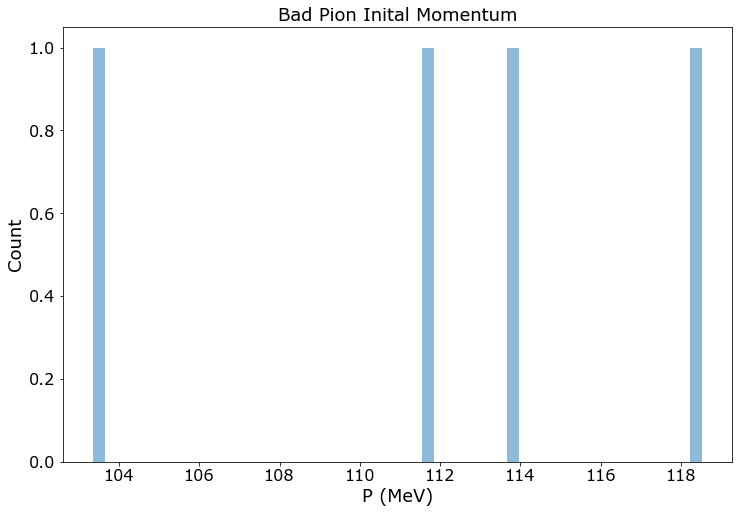

In [21]:
_ = splt.hist(df_mu_bad.parent_p.values, bins=50)
plt.title('Bad Pion Inital Momentum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.show()

_ = splt.hist(df_mu_bad.parent_pz.values, bins=50, histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad.parent_pr.values, bins=50, histtype='step', label='Pr', range=(-120,120))
plt.title('Bad Pion Initial Momenum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()
plt.show()

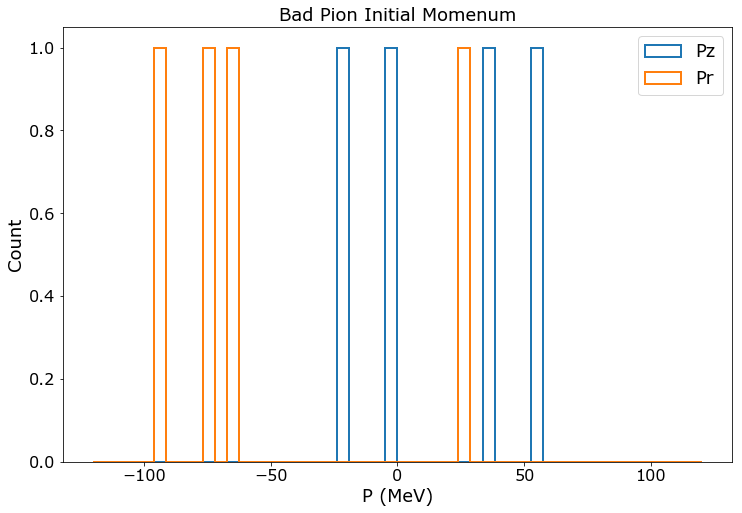

In [23]:
_ = splt.hist(df_mu_bad.parent_pz.values, bins=50, histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad.parent_pr.values, bins=50, histtype='step', label='Pr', range=(-120,120))
plt.title('Bad Pion Initial Momenum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()

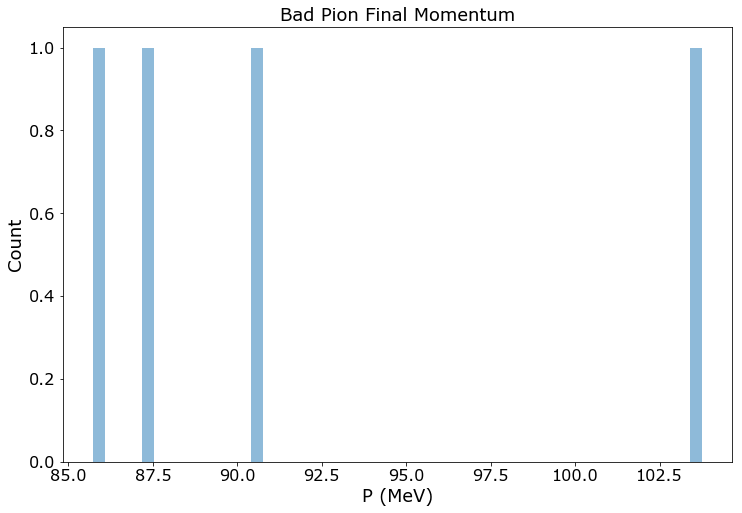

In [24]:
_ = splt.hist(df_mu_bad.parent_pstop.values, bins=50)
plt.title('Bad Pion Final Momentum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')

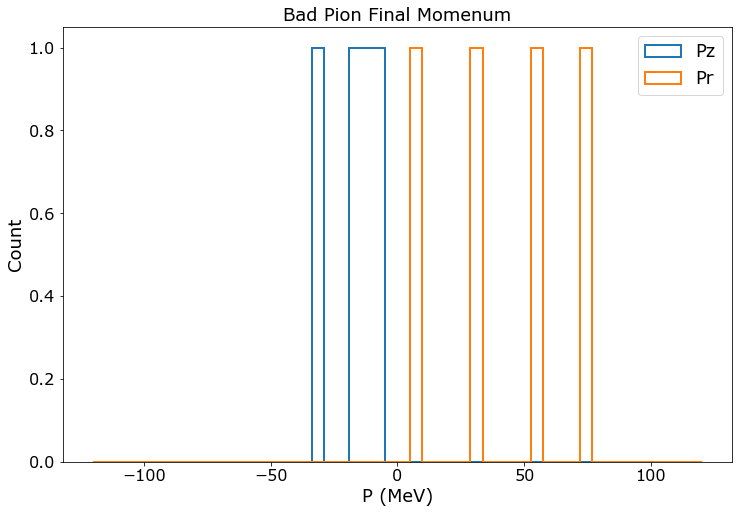

In [25]:
_ = splt.hist(df_mu_bad.parent_pzstop.values, bins=50, histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad.parent_prstop.values, bins=50, histtype='step', label='Pr', range=(-120,120))
plt.title('Bad Pion Final Momenum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()

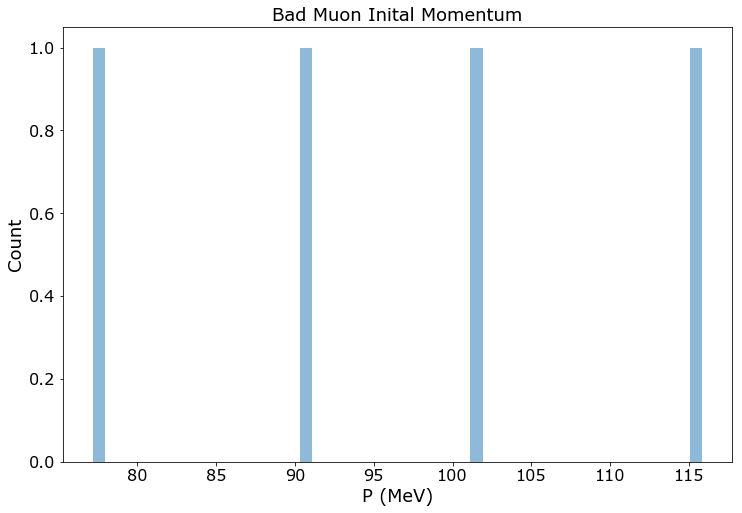

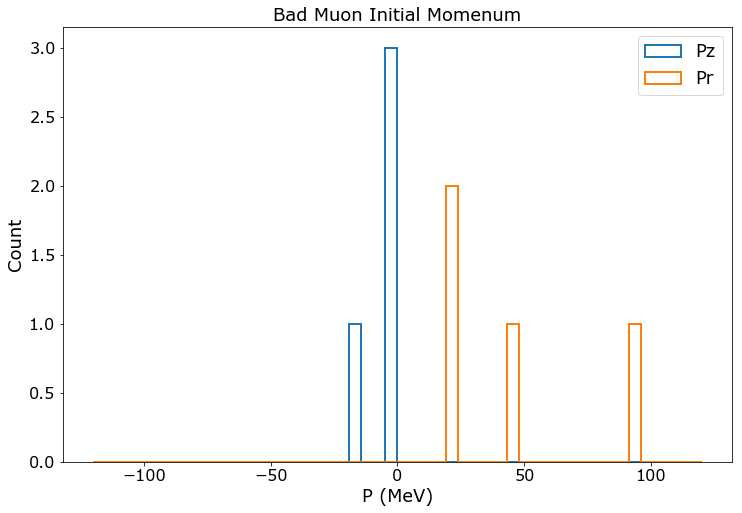

In [26]:
_ = splt.hist(df_mu_bad.p.values, bins=50)
plt.title('Bad Muon Inital Momentum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.show()

plt.figure()
_ = splt.hist(df_mu_bad.pz.values, bins=50, histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad.pr.values, bins=50, histtype='step', label='Pr', range=(-120,120))
plt.title('Bad Muon Initial Momenum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()
plt.show()

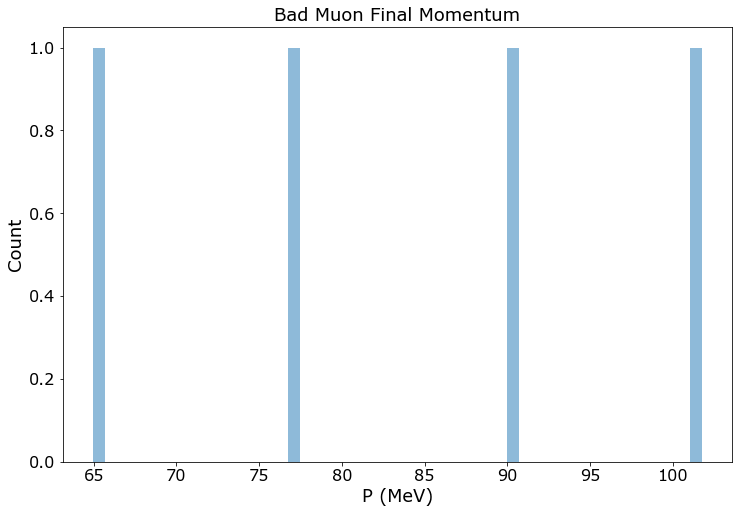

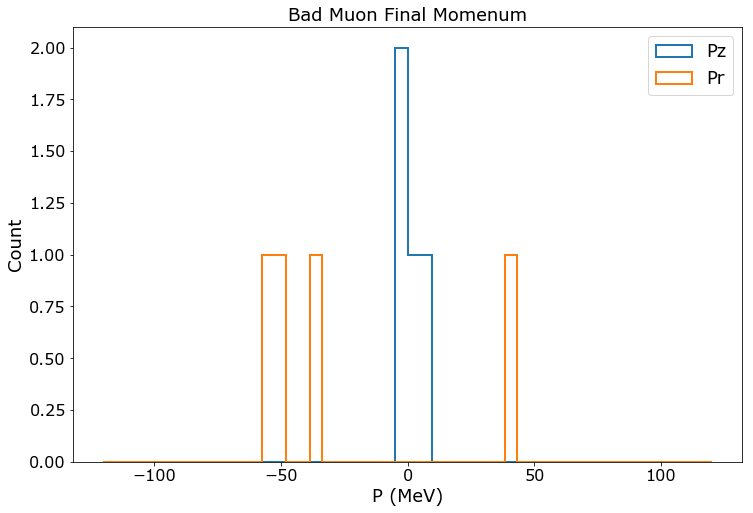

In [27]:
_ = splt.hist(df_mu_bad.pstop.values, bins=50)
plt.title('Bad Muon Final Momentum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.show()

plt.figure()
_ = splt.hist(df_mu_bad.pzstop.values, bins=50, histtype='step', label='Pz', range=(-120,120))
_ = splt.hist(df_mu_bad.prstop.values, bins=50, histtype='step', label='Pr', range=(-120,120))
plt.title('Bad Muon Final Momenum')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()
plt.show()

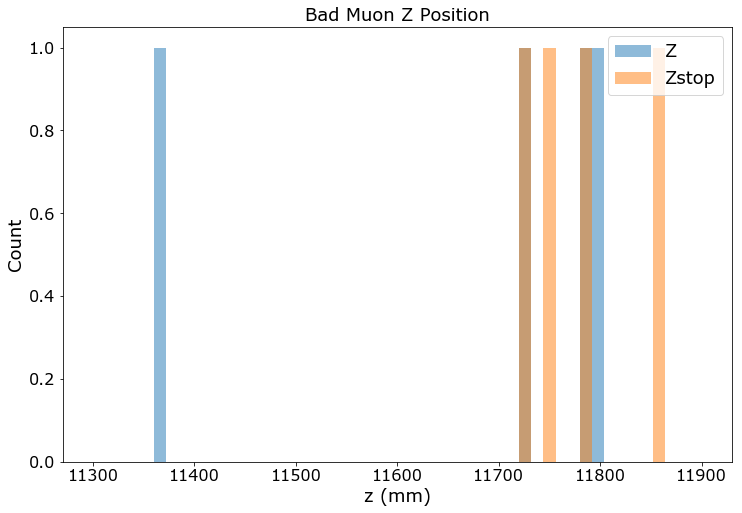

In [37]:
_ = splt.hist(df_mu_bad.z.values, bins=50, histtype='stepfilled', label='Z', range=(11300,11900))
_ = splt.hist(df_mu_bad.zstop.values, bins=50, histtype='stepfilled', label='Zstop', range=(11300,11900))
plt.title('Bad Muon Z Position')
plt.xlabel('z (mm)')
plt.ylabel('Count')
plt.legend()
plt.show()

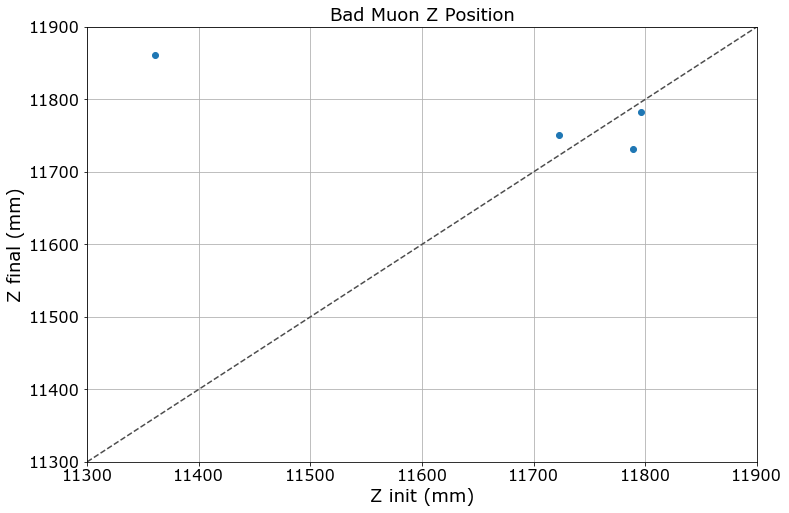

In [44]:
_ = plt.plot(df_mu_bad.z.values, df_mu_bad.zstop.values, 'o')
plt.xlim(11300, 11900)
plt.ylim(11300, 11900)
plt.title('Bad Muon Z Position')
plt.xlabel('Z init (mm)')
plt.ylabel('Z final (mm)')
ax = plt.gca()
ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c=".3")
plt.grid()
plt.legend()
plt.show()

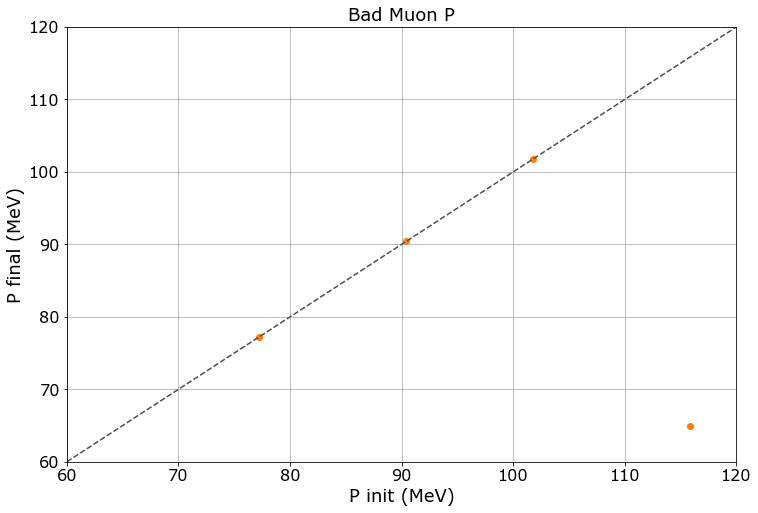

In [46]:
_ = plt.plot(df_mu_bad.p.values, df_mu_bad.pstop.values, 'oC1')
plt.title('Bad Muon P')
plt.xlabel('P init (MeV)')
plt.ylabel('P final (MeV)')
plt.xlim(60,120)
plt.ylim(60,120)
ax = plt.gca()
ax.plot(ax.get_xlim(), ax.get_ylim(), ls="--", c=".3")
plt.grid()
plt.legend()
plt.show()

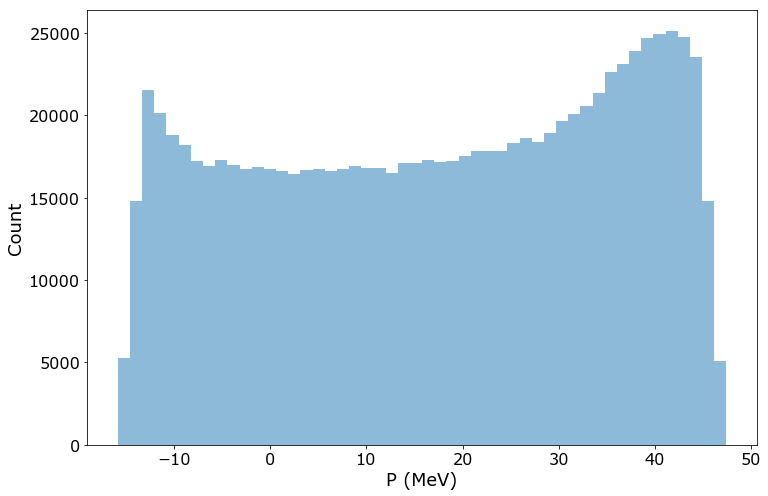

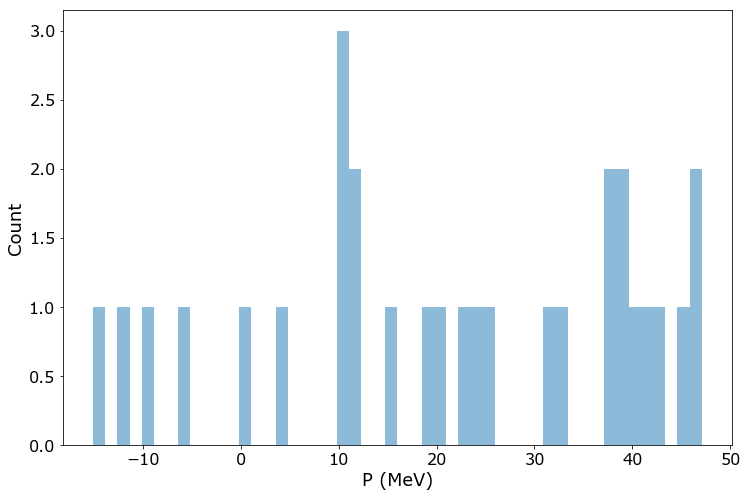

In [61]:
_ = splt.hist(df_ntpart[(df_ntpart.parent_pzstop>18)&(df_ntpart.parent_pzstop<22)&(df_ntpart.parent_pstop>100)].pz.values, bins=50)
plt.title('')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.show()

plt.figure()
_ = splt.hist(df_ntpart[(df_ntpart.parent_pzstop>18)&(df_ntpart.parent_pzstop<22)&(df_ntpart.parent_pstop>100)&(df_ntpart.z>11300)&(df_ntpart.z<11900)].pz.values, bins=50)
plt.title('')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.show()


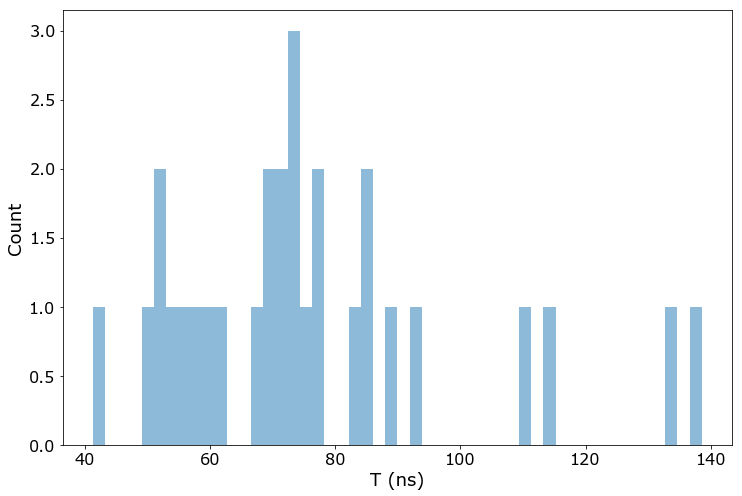

In [63]:
_ = splt.hist(df_ntpart[(df_ntpart.parent_pzstop>18)&(df_ntpart.parent_pzstop<22)&(df_ntpart.parent_pstop>100)&(df_ntpart.z>11300)&(df_ntpart.z<11900)].time.values, bins=50)
plt.title('')
plt.xlabel('T (ns)')
plt.ylabel('Count')
plt.show()

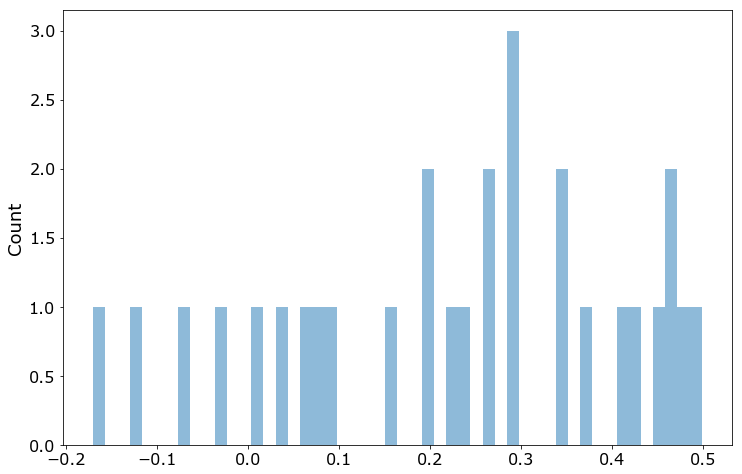

In [68]:
df_tmp = df_ntpart[(df_ntpart.parent_pzstop>18)&(df_ntpart.parent_pzstop<22)&(df_ntpart.parent_pstop>100)&(df_ntpart.z>11300)&(df_ntpart.z<11900)]
_ = splt.hist(df_tmp.parent_pz.values/df_tmp.parent_p.values, bins=50)
plt.title('')
plt.xlabel('')
plt.ylabel('Count')
plt.show()

In [7]:
df_ntpart.query('tstop>600')

trk  pdg       time  gtime           x           y  \
run subrun evt                                                         
1   227    48800   10   13  60.107563    0.0  -78.301025  557.803711   
    455    57324   22   13  75.137978    0.0 -565.647461  -77.146667   
    717    88447   15   13  84.606682    0.0  -27.139404  300.064178   
    821    14394   10   13  99.199661    0.0 -499.848633  430.496704   

                             z         px          py         pz           p  \
run subrun evt                                                                 
1   227    48800  11796.577148 -67.076370   38.204205  -0.361283   77.194115   
    455    57324  11360.633789  -3.975028 -114.747955 -15.141302  115.810844   
    717    88447  11722.920898 -52.086487   87.404129  -0.097280  101.747200   
    821    14394  11789.155273 -73.577766  -52.577679  -0.345588   90.433502   

                  code  isstop       tstop      gtstop       xstop  \
run subrun evt                                                       
1   227    48800    14   False  700.085754  516.754150 -500.883301   
    455    57324    14   False  636.674561  422.521759 -318.961914   
    717    88447    14   False  700.044861  443.308136 -619.536133   
    821    14394    14   False  700.096313  456.513885 -549.774414   

                       ystop         zstop  codestop     pxstop     pystop  \
run subrun evt                                                               
1   227    48800  206.229691  11782.931641        54  25.878363 -72.726151   
    455    57324  141.623642  11861.008789        54 -57.355175 -29.711470   
    717    88447 -162.836227  11750.968750        54  60.635452 -81.705116   
    821    14394 -127.727928  11731.649414        54  69.870720 -57.411255   

                    pzstop       pstop  g4bl_evt  g4bl_trk  g4bl_weight  \
run subrun evt                                                            
1   227    48800 -0.384185   77.194107         0         0          0.0   
    455    57324  6.887558   64.960190         0         0          0.0   
    717    88447  0.327910  101.747192         0         0          0.0   
    821    14394 -0.498317   90.433502         0         0          0.0   

                  g4bl_time  parent_id  parent_pdg     parent_x   parent_y  \
run subrun evt                                                               
1   227    48800        0.0          1        -211 -3843.128418 -51.095547   
    455    57324        0.0          1        -211 -3918.935059  74.319809   
    717    88447        0.0          1        -211 -3925.500244  29.621664   
    821    14394        0.0          1        -211 -3937.682861 -30.651400   

                     parent_z  parent_px   parent_py  parent_pz    parent_p  \
run subrun evt                                                                
1   227    48800  5962.886230  94.821983   22.869198  34.161285  103.349899   
    455    57324  5523.315430 -26.061977  102.363777  53.747532  118.517372   
    717    88447  5523.206055  63.955948   94.145065  -1.857825  113.829292   
    821    14394  5531.100586  75.027527   80.256050 -20.828138  111.821175   

                  parent_pxstop  parent_pystop  parent_pzstop  parent_pstop  \
run subrun evt                                                                
1   227    48800     -66.776299      45.569565     -33.413559     87.476425   
    455    57324       7.587883    -102.920578     -10.649387    103.747917   
    717    88447     -56.168716      70.363960      -8.988070     90.480919   
    821    14394     -75.458313     -36.133423     -18.708908     85.729836   

                  parent_code  parent_lastke  
run subrun evt                                
1   227    48800           14      25.147652  
    455    57324           14      34.336319  
    717    88447           14      26.762730  
    821    14394           14      24.226780

In [14]:
df_maybe_bad = df_ntpart[(df_ntpart.x>-700)&(df_ntpart.x<700)&(df_ntpart.y>-700)&(df_ntpart.y<700)&(df_ntpart.z<11900)&(df_ntpart.z>11200)&(df_ntpart.p>75)&(np.abs(df_ntpart.pz)<20)]

In [15]:
df_maybe_bad

trk  pdg        time  gtime           x           y  \
run subrun evt                                                          
1   0      11396    9   13   61.220772    0.0  100.178955  573.517334   
           12722   10   13   81.017006    0.0  253.563965   40.434853   
           22471    8   13   69.828148    0.0 -278.831543  -99.325653   
           24042    8   13   62.114895    0.0  379.045410  262.189880   
           31149   16   13   61.791367    0.0 -549.424316  158.512009   
           37101   17   13   74.179916    0.0  231.633301 -224.651047   
           40489    9   13   87.722839    0.0   37.533203 -175.854263   
           44563   18   13   69.757065    0.0  538.725098 -282.642456   
           47482   16   13   77.047554    0.0  -21.902832 -600.340027   
           54563   12   13   63.432320    0.0 -362.097168 -551.836670   
           57208   16   13   63.235352    0.0  281.554688  469.047424   
           69204    7   13   81.256981    0.0  -91.985596 -224.226547   
           71486   16   13  100.829552    0.0  452.324707  178.246918   
           74440   10   13   75.609291    0.0 -128.866943 -145.232803   
           74515   11   13   80.456238    0.0  -71.406006 -499.192596   
           90374    3   13   90.313110    0.0 -259.050293 -401.432526   
           96606    9   13   81.658913    0.0 -150.192139  276.396179   
    1      2263    15   13   79.616806    0.0 -533.084961 -229.218353   
           6448    14   13   70.620033    0.0  373.073730 -376.407349   
           8950    13   13   67.946625    0.0  337.437012 -240.509293   
           13051   17   13   64.629532    0.0 -236.545898 -481.303741   
           17157   10   13   77.506485    0.0 -594.579590 -220.870392   
           25579   11   13   77.826904    0.0 -297.416016  336.080750   
           29290    9   13   66.535049    0.0  335.466553   33.072945   
           35805   13   13   60.857304    0.0 -179.376465  342.454437   
           37889   11   13   70.075638    0.0  498.088623 -318.269623   
           39752    3   13   76.297394    0.0  337.378418  -79.795631   
           47473   10   13   56.240715    0.0  -29.296631   90.899284   
           61825   12   13   76.424652    0.0  -41.114014 -151.274460   
           62223   13   13   84.335754    0.0 -372.310059 -234.935196   
...               ...  ...         ...    ...         ...         ...   
    997    90579   12   13   90.443359    0.0   11.641113 -227.077118   
           94289   14   13   79.614189    0.0  147.279785  388.268494   
           94519   11   13   62.510399    0.0  142.286865  464.545868   
    998    8108    19   13   83.574059    0.0 -116.706543  323.315552   
           17777   13   13   68.271645    0.0  250.758545  473.796143   
           32355    7   13   69.840668    0.0 -307.932617 -438.775330   
           32543   14   13   68.066223    0.0  -63.094971  432.104767   
           38734   12   13   67.946129    0.0  288.013184   89.821602   
           39463   17   13   71.793175    0.0  223.990234  531.937012   
           58458   10   13   69.506401    0.0 -561.903809   77.457695   
           69073   16   13   60.461044    0.0  479.123779 -119.200600   
           79657    6   13   76.382133    0.0  447.958008 -343.288544   
           85568    9   13   75.349083    0.0    9.602783  135.434738   
           90840   16   13   79.501312    0.0 -480.144531  -92.068909   
    999    2482    14   13   70.405640    0.0  180.443115  239.219513   
           3410    11   13   82.015709    0.0   43.556641  185.976730   
           13799   13   13   80.139648    0.0 -429.090820 -445.242432   
           27355   15   13   59.699108    0.0  176.223389  -34.985493   
           30302   17   13   89.817398    0.0 -222.395508  -83.332474   
           30657   15   13   98.046234    0.0   85.544189  -62.071377   
           39467    9   13   68.652214    0.0 -228.526367  456.162323   
           47377   16   13   74.094643    0.0  484.897949 -299.102020   
   

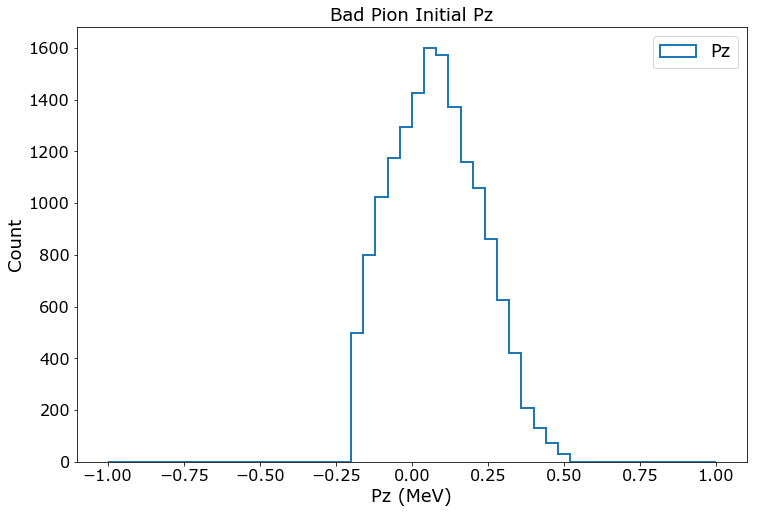

In [27]:
_ = splt.hist(df_maybe_bad.parent_pz.values/df_maybe_bad.parent_p.values, bins=50, histtype='step', label='Pz', range=(-1,1))
plt.title('Bad Pion Initial Pz')
plt.xlabel('Pz (MeV)')
plt.ylabel('Count')
plt.legend()

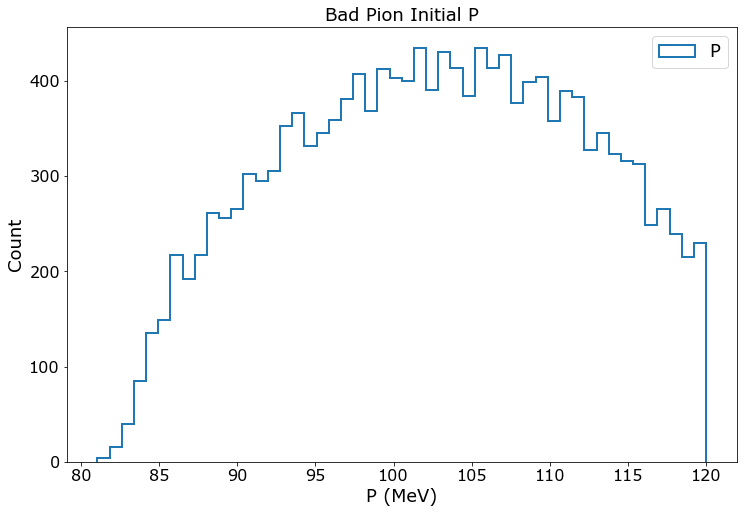

In [20]:
_ = splt.hist(df_maybe_bad.parent_p.values, bins=50, histtype='step', label='P')
plt.title('Bad Pion Initial P')
plt.xlabel('P (MeV)')
plt.ylabel('Count')
plt.legend()

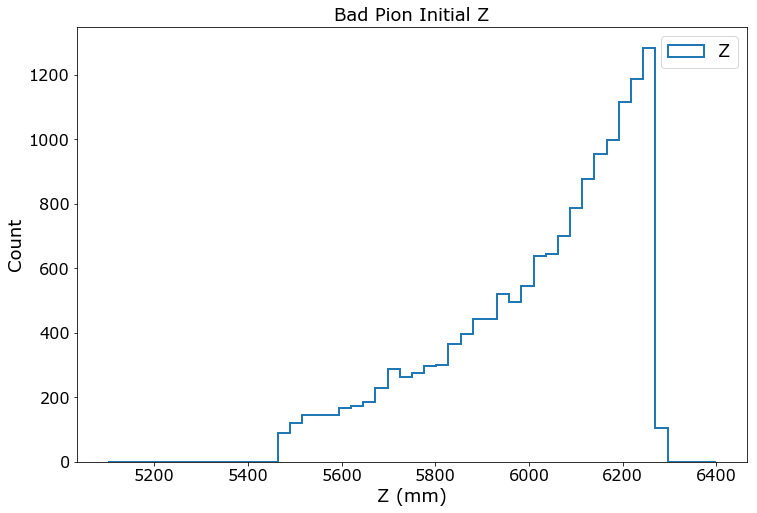

In [23]:
_ = splt.hist(df_maybe_bad.parent_z.values, bins=50, histtype='step', label='Z', range=(5100,6400))
plt.title('Bad Pion Initial Z')
plt.xlabel('Z (mm)')
plt.ylabel('Count')
plt.legend()

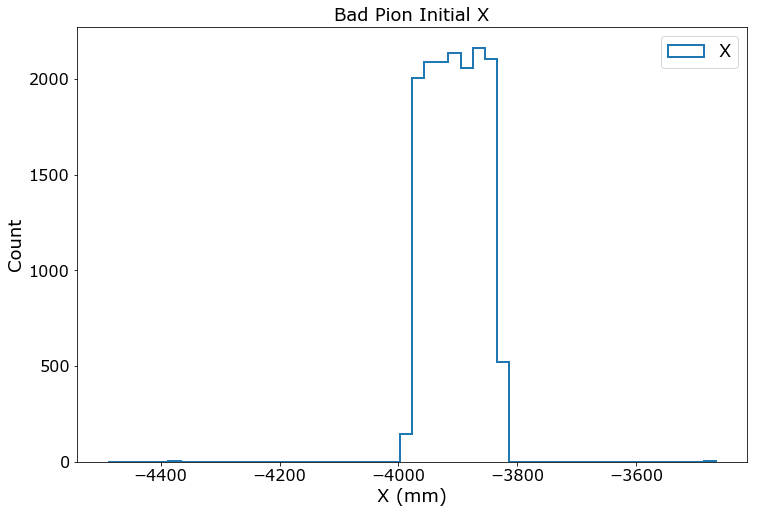

In [25]:
_ = splt.hist(df_maybe_bad.parent_x.values, bins=50, histtype='step', label='X')
plt.title('Bad Pion Initial X')
plt.xlabel('X (mm)')
plt.ylabel('Count')
plt.legend()